<a href="https://colab.research.google.com/github/giim86/Lee-Giim/blob/main/yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

우선 roboflow에서 Aquarium Dataset을 다운받아 구글 Drive에 업데이트함

In [ ]:
from google.colab import drive
import os
import yaml

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


구글 Drive에 올려놓은 데이터를 사용하기 위해서 drive모듈을 가져왔으며, python의 os모듈도 가져왔음.
yaml모듈 또한 가져왔는데 이 모듈은 사람이 읽고 쓸 수 있도록 데이터를 직렬화하는 형식인 YAML 형식을 다루기 위해 가져온 것임.
그 후 내 drive 경로에 마운트하여 drive에 접근할 수 있게 했음.


In [ ]:
print('현재 작업 경로:', os.getcwd())
os.chdir('/content/drive/MyDrive')
print('변경된 작업 경로:', os.getcwd())

현재 작업 경로: /content
변경된 작업 경로: /content/drive/MyDrive


데이터셋이 있는 곳으로 작업 경로를 바꿈.

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install pillow==8.3.2
%pip install -qr requirements.txt
%pip install -q roboflow

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/drive/MyDrive/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 752.1/752.1 kB 42.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.3.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 1.2 MB/s eta 0:00:00


YOLOv5를 사용해야하기 때문에 github에 있는 YOLOv5 소스코드를 다운로드했음. 그 후 가져온 YOLOv5로 디렉토리를 변경하고, python 패키지를 설치했는데 이 때 YOLOv5과 라이브러리 간의 호환성을 유지하기 위해 8.3.2버전으로 설치했음.
 그 후 프로젝트에 필요한 추가적인 패키지들을 설치하고, 데이터를 roboflow에서 다운받았기 때문에 rovoflow의 라이브러리 또한 설치했음.


In [ ]:
data_dir = '/content/drive/MyDrive/dataset/Aquarium_Combined'
data_yaml = '/content/drive/MyDrive/dataset/Aquarium_Combined/data.yaml'

 모델 학습에 사용할 Aqyarium_Combined 데이터셋이 위치한 곳의 디렉토리의 경로를 지정하고, Aquarium_Combined에 대한 정보를 담은 YAML 파일의 경로를 지정해줌.
  이 YAML 파일이 모델 학습에 필요한 클래스의 목록과 학습 및 검증 데이터의 경로의 정보를 담고 있음.

In [ ]:
with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)

{'names': ['fish',
  'jellyfish',
  'penguin',
  'puffin',
  'shark',
  'starfish',
  'stingray'],
 'nc': 7,
 'train': '/content/drive/MyDrive/dataset/Aquarium_Combined/train/images',
 'val': '/content/drive/MyDrive/dataset/Aquarium_Combined/test/images'}

YAML 형식의 파일을 변수 ‘film’에 저장하여 python 객체로 변환함.
 그 후 해당 내용을 출력해서 총 7개의 class가 있음을 확인함.

In [ ]:
film['train'] = '/content/drive/MyDrive/dataset/Aquarium_Combined/train/images'
film['val'] = '/content/drive/MyDrive/dataset/Aquarium_Combined/test/images'

with open(data_yaml, 'w') as f:
  yaml.dump(film, f)

print('변경된 yaml 파일:')
with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)

변경된 yaml 파일:


{'names': ['fish',
  'jellyfish',
  'penguin',
  'puffin',
  'shark',
  'starfish',
  'stingray'],
 'nc': 7,
 'train': '/content/drive/MyDrive/dataset/Aquarium_Combined/train/images',
 'val': '/content/drive/MyDrive/dataset/Aquarium_Combined/test/images'}

현재 데이터셋이 drive에 있으므로 YAML 파일의 ‘train’과 ‘val’의 값을 데이터셋의 train에 들어있는 이미지와 test에 들어있는 이미지로 경로를 수정함. display로 수정된 경로를 확인함.

In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data {data_yaml} --weights yolov5s.pt --cache

2024-04-28 12:21:39.020722: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-28 12:21:39.020781: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-28 12:21:39.022747: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/dataset/Aquarium_Combined/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, de

YOLOv5 모델을 학습시키는 코드임.

!python train.py: python 스크립트를 실행하는 명령어

--img 416: 입력 이미지가 416*416 크기로 처리됨

--batch 16: 한 번에 처리할 이미지의 개수이며, 크기를 16으로 설정함

--epochs 150: 학습을 총 150번 진행함

--data {data_yaml}: Aquarium 데이터셋의 정보를 담은 YAML 파일의 경로를 나타냄

--weights yolov5s.pt: 사전에 학습된 가중치 파일인 yolov5s.pt의 경로를 나타냄

--cache: 데이터 로딩시간을 단축시킴

학습은 총 0.260시간이 걸렸고, 이 모델은 전체 7개의 클래스에 대해 평균적으로 0.808의 정밀도와 0.742의 재현율을 보였으며 mAP(평균정밀도)는 0.789를 보임.
또한 이 학습 결과는 runs/train/exp6 디렉토리에 저장됨



In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

위에서 저장된 학습결과를 Tensorboard로 시각화함. 이 때 학습결과가 exp6에 저장되었있기에 exp6만 필터링하여 확인을 함.

In [ ]:
test_data_dir = film['val']
train_exp_num = 6

데이터셋의 테스트 이미지가 들어있는 경로를 변수 ‘test_data_dir’에 저장하고, 학습 결과가 저장된 파일의 번호를 변수 ‘train_exp_num’에 저장함.

In [ ]:
!python val.py --data {data_yaml} --weights runs/train/exp6/weights/best.pt --batch-size 16 --imgsz 416 --conf-thres 0.3 --iou-thres 0.6

val: data=/content/drive/MyDrive/dataset/Aquarium_Combined/data.yaml, weights=['runs/train/exp6/weights/best.pt'], batch_size=16, imgsz=416, conf_thres=0.3, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.3 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-304-g22361691 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/MyDrive/dataset/Aquarium_Combined/test/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100% 63/63 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadl

학습된 YOLOv5을 테스트하는 코드임

!python train.py: python 스크립트를 실행하는 명령어, 검증 스트립트를 실행함

--data {data_yaml}: Aquarium 데이터셋의 정보를 담은 YAML 파일의 경로를 나타냄

--weights runs/train/exp3/weights/best.pt: 학습된 가중치 파일의 경로이며, 최적 가중치 파일을 사용함

--batch 16: 한 번에 처리할 이미지의 개수이며, 크기를 16으로 설정함

--img 416: 입력 이미지가 416*416 크기로 처리됨

--conf-thres 0.3: 신뢰도 임계값을 나타내는 인자임. 이 값보다 낮은 신뢰도를 갖는 객체는 무시됨

--iou-thres 0.6: IOU 임계값을 나타내는 인자임. 겹치는 객체를 얼마나 허용할지 결정함.

각 이미지를 전처리하는 데 평균 1.1ms가 소요되고, 이미지를 추록하는 데 평균 11.2ms가 소요됨. 또한 중복된 객체를 제거하는 데는 평균 19.5ms가 소요됨.
 7개의 클래스에 대한 정밀도는 0.833, 재현율은 0.731 mAP(평균 정밀도)는 0.82로 나타남.
또한 이 테스트 결과는 runs/val/exp6 디렉토리에 저장됨.


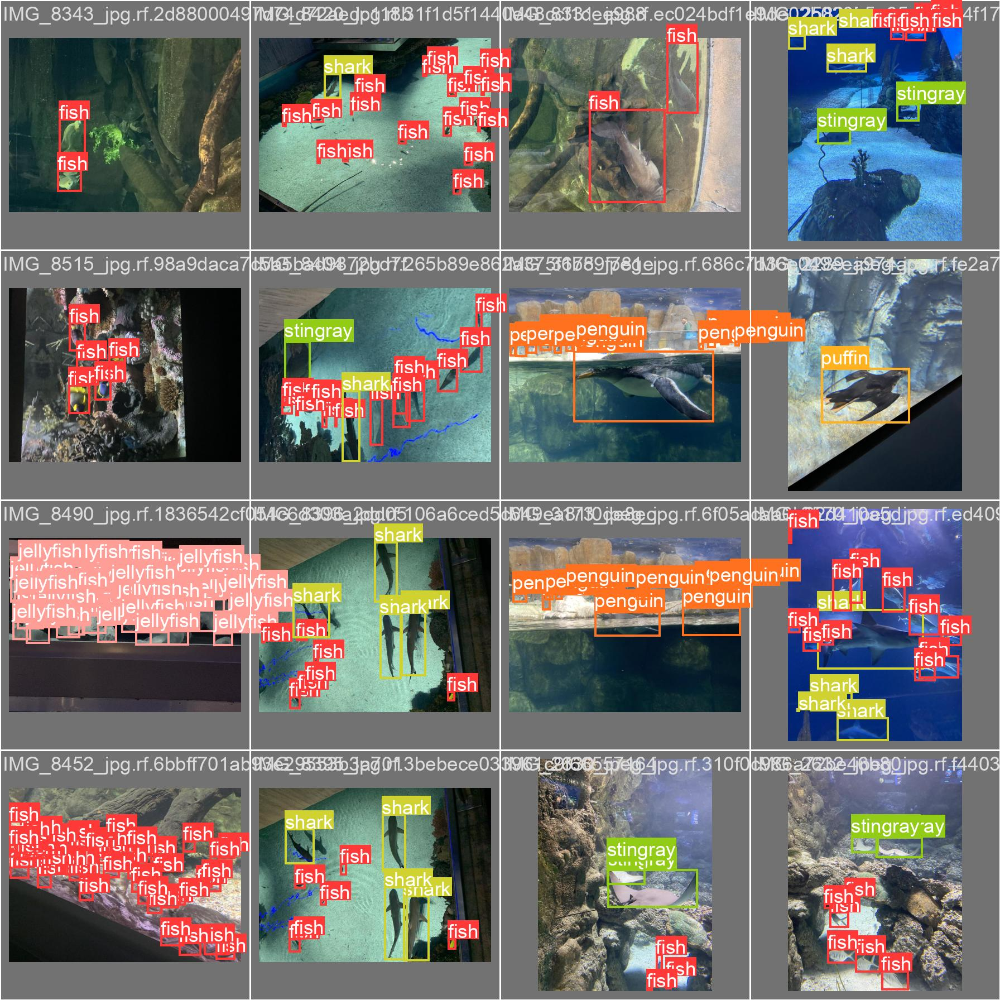

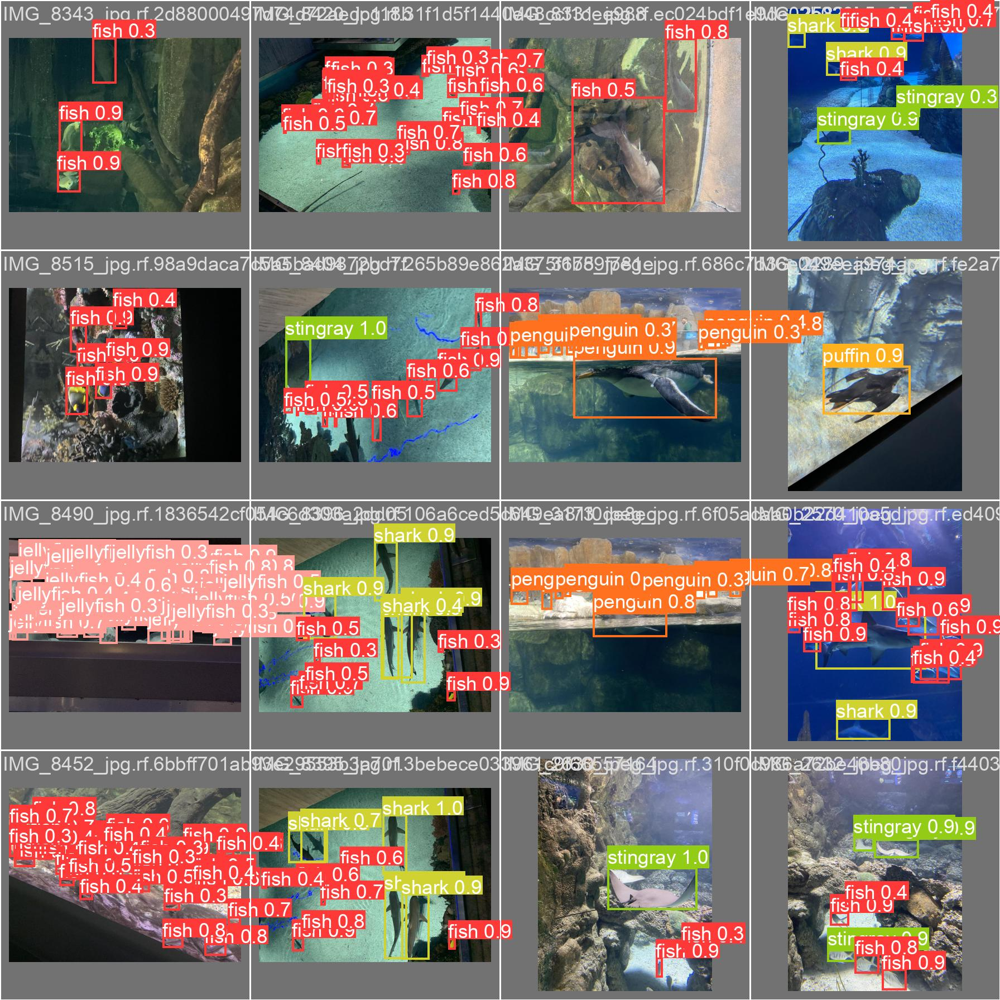

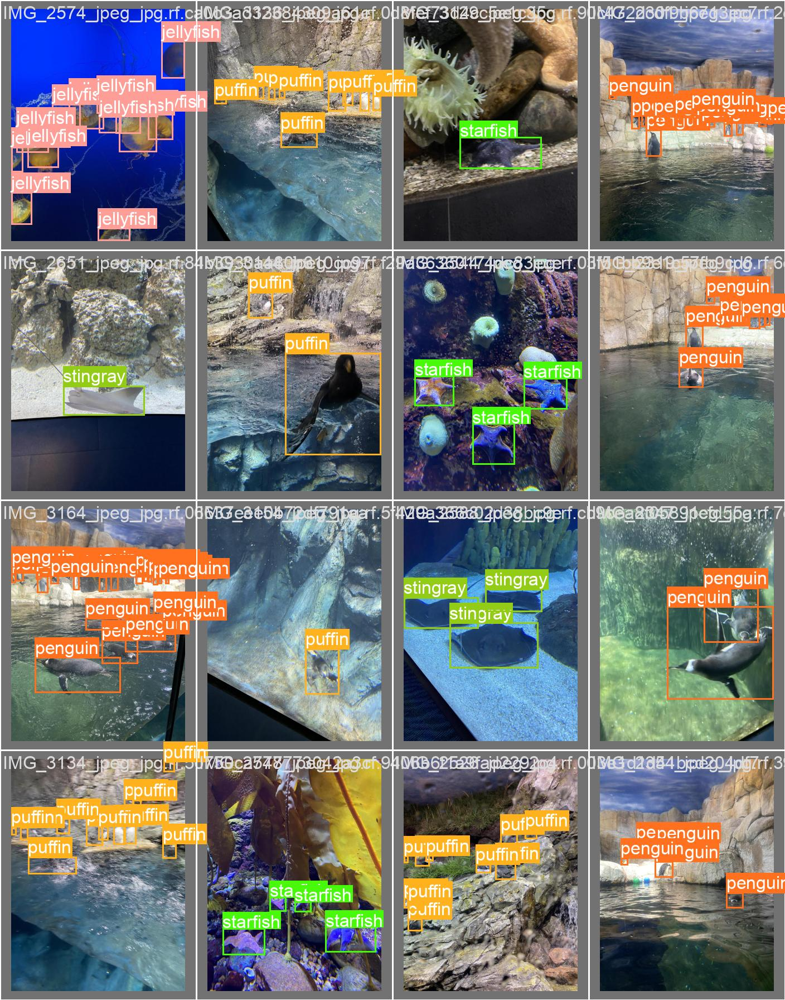

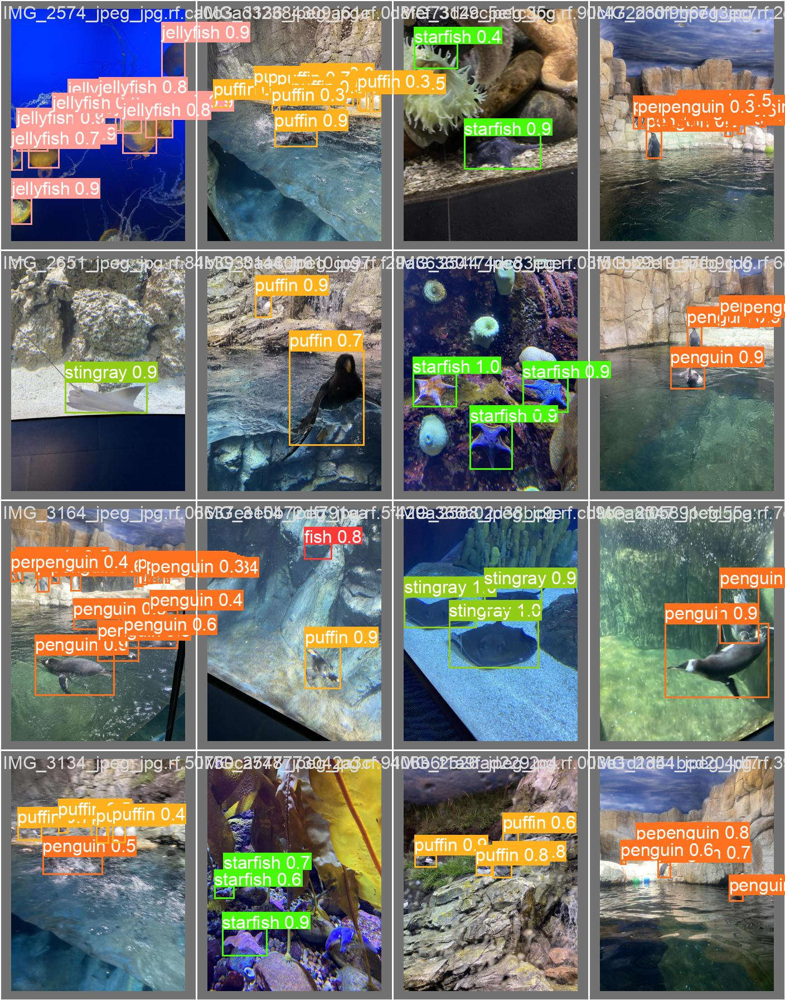

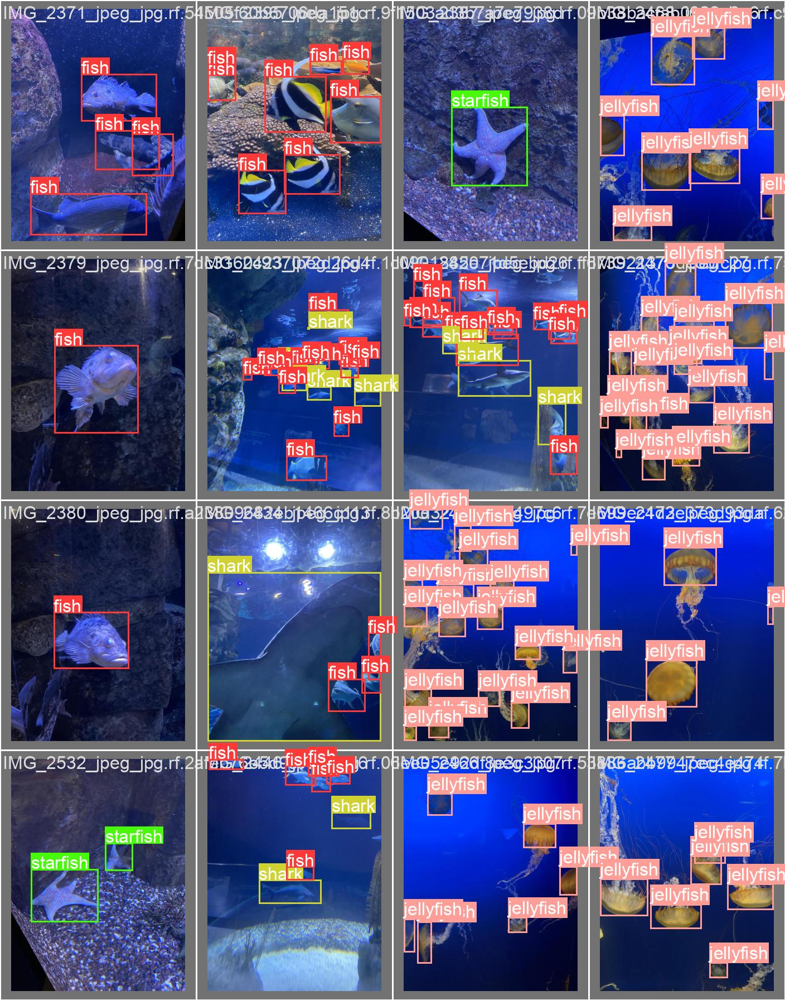

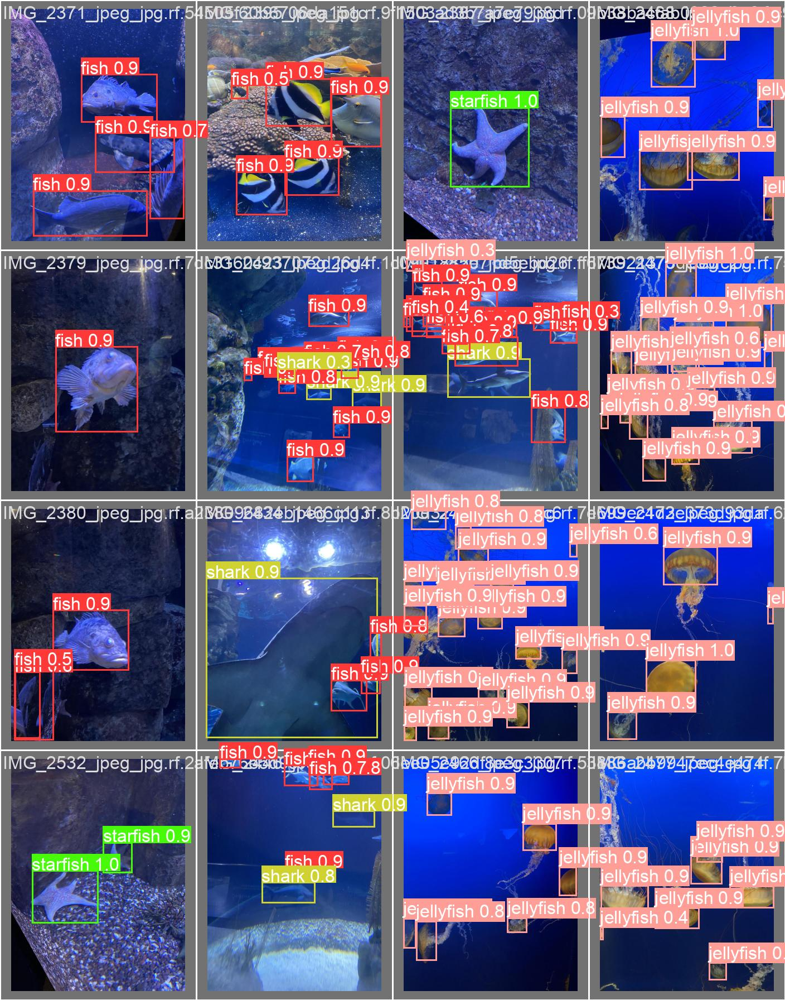

In [ ]:
import glob
from IPython.display import Image, display

import glob
from IPython.display import Image, display

test_exp_num = 6

if not os.path.exists('/content/drive/MyDrive/yolov5/runs/val/exp' + str(test_exp_num) + '/') :
  raise Exception('test_exp_num 을 다시 확인하세요.')

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/val/exp' + str(test_exp_num) + '/*.jpg'):
  display(Image(filename=imageName))
  print("\n")

 테스트 결과가 저장된 파일의 번호를 변수 ‘test_exp_num’에 저장함. 추가로 테스트 결과가 저장된 디렉토리가 존재하는 지 확인을 하고, 그 디렉토리에 저장된 검증 결과를 이미지로 확인함.
: